In [4]:
# Pandas
import pandas as pd

# Scikit learn
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle, resample
from sklearn.utils import class_weight
from sklearn.model_selection import cross_val_score

# Keras
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, LSTM
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import to_categorical, np_utils
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping,ReduceLROnPlateau,ModelCheckpoint,TensorBoard,ProgbarLogger

# Audio
import librosa
import librosa.display
import wave
import IPython.display as ipd

# Plot
import matplotlib.pyplot as plt
import seaborn as sns

# Utility
import os
from glob import glob
import numpy as np
from tqdm import tqdm
import itertools
import numpy as np
from scipy.io import wavfile
import fnmatch

Using TensorFlow backend.


In [24]:
demographics = pd.read_csv('./Documents/respiratory-sound-database/demographic_info.txt', names = ['Patient number', 'Age', 'Sex' , 'Adult BMI (kg/m2)', 'Child Weight (kg)' , 'Child Height (cm)'], delimiter = ' ')

diagnosis = pd.read_csv('./Documents/respiratory-sound-database/patient_diagnosis.csv', names = ['Patient number', 'Diagnosis'])

COPD              64
Healthy           26
URTI              14
Bronchiectasis     7
Pneumonia          6
Bronchiolitis      6
LRTI               2
Asthma             1
Name: Diagnosis, dtype: int64


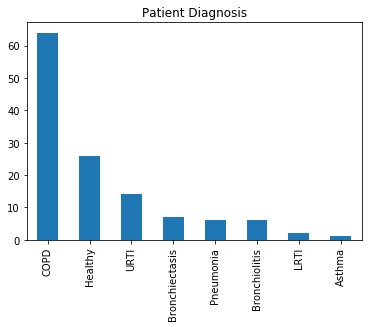

In [30]:
df = demographics.join(diagnosis.set_index('Patient number'), on = 'Patient number', how = 'left')
df['Patient_ID'] = df['Patient number']
print(df['Diagnosis'].value_counts())

df['Diagnosis'].value_counts().plot.bar(title = "Patient Diagnosis")

M    79
F    46
Name: Sex, dtype: int64


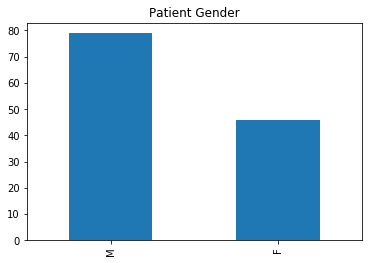

In [40]:
print(df['Sex'].value_counts())

df['Sex'].value_counts().plot.bar(title = "Patient Gender")

Average age: 42.99264 years
Youngest patient: 0.25 years
Oldest patient: 93.0 years


C:\Users\mike1\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\mike1\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([39., 10.,  2.,  0.,  1.,  1., 23., 29., 17.,  3.]),
 array([ 0.25 ,  9.525, 18.8  , 28.075, 37.35 , 46.625, 55.9  , 65.175,
        74.45 , 83.725, 93.   ]),
 <a list of 10 Patch objects>)

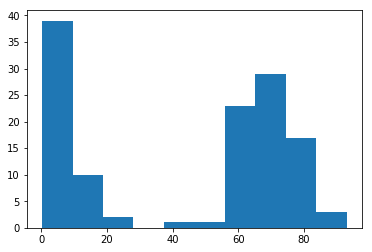

In [58]:
# Time Distribution
print("Average age:", np.mean(df['Age']), "years")
print("Youngest patient:", np.min(df['Age']), "years")
print("Oldest patient:", np.max(df['Age']), "years")

plt.hist(df['Age'])

In [2]:
from datetime import datetime
from os import listdir
from os.path import isfile, join

mypath = "./Documents/respiratory-sound-database/Respiratory_Sound_Database/Respiratory_Sound_Database/audio_and_txt_files/"
filenames = [f for f in listdir(mypath) if (isfile(join(mypath, f)) and f.endswith('.wav'))]

In [5]:
patient_id = [] # patient IDs corresponding to each file
for name in filenames:
    patient_id.append(int(name[:3])) 

In [8]:
#Create artifact dataframe
sounds = pd.DataFrame()
sounds['Patient_ID'] = np.asarray(patient_id)

In [10]:
sounds.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 920 entries, 0 to 919
Data columns (total 1 columns):
Patient_ID    920 non-null int32
dtypes: int32(1)
memory usage: 3.7 KB


In [11]:
#Function to get audio duration for each file
def get_recording_times(audio_files):
    data = []
    for file in audio_files:
        y, sr = librosa.load(file, res_type='kaiser_fast')
        dur = librosa.get_duration(y)
        data.append(dur)
    return data

In [12]:
#Function to get mel-frequency cepstral coefficient data for each file
def get_mfcc(audio_files):
    data = []
    for file in audio_files:
        y, sr = librosa.load(file, res_type='kaiser_fast')
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40) #sr = set of values at a point in time and/or space
        data.append(mfccs)
    return data

In [13]:
#Function to get mean mfccs for each file with a fix padding, may also chop off some file
def load_file_mfcc (folder,file_names, duration=10, sr=16000):
    input_length=sr*duration
    data = []
    for file_name in file_names:
        try:
            sound_file=folder+file_name
            X, sr = librosa.load( sound_file, sr=sr, duration=duration,res_type='kaiser_fast') 
            dur = librosa.get_duration(y=X, sr=sr)
            # pad audio file same duration
            if (round(dur) < duration):
                y = librosa.util.fix_length(X, input_length)
            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=40).T,axis=0)             
        except Exception as e:
            print("Error encountered while parsing file: ", file)        
        feature = np.array(mfccs).reshape([-1,1])
        data.append(feature)
    return data

In [14]:
#Function to get spectrogram data for each file with a fix padding, may also chop off some file
def load_file_spec (folder,file_names, duration=10, sr=16000):
    input_length=sr*duration
    data = []
    for file_name in file_names:
        try:
            sound_file=folder+file_name
            X, sr = librosa.load( sound_file, sr=sr, duration=duration,res_type='kaiser_fast') 
            dur = librosa.get_duration(y=X, sr=sr)
            # pad audio file same duration
            if (round(dur) < duration):
                y = librosa.util.fix_length(X, input_length)  
            spec_features = np.mean(librosa.amplitude_to_db(abs(librosa.stft(y)).T), axis=0)
        except Exception as e:
            print("Error encountered while parsing file: ", file_name) 
        data.append(spec_features)
    return data

In [15]:
# Function to flatten out spectrogram and mfcc data
# This is used to easily separate out that data into individual columns that will be used for supervised learning
def flat_(file):
    data=[]
    for x in file:
        flat = x.flatten()
        data.append(flat)
    return data

In [17]:
data = './Documents/audio_and_txt_files'
audio_files = glob(data + '/*.wav')
print("Number of audio files:", len(audio_files))

Number of audio files: 920


In [18]:
sounds['duration'] = np.asarray(get_recording_times(audio_files))

In [23]:
# parent folder of sound files
INPUT_DIR = "./Documents"
# 16 KHz
SAMPLE_RATE = 16000
# seconds
MAX_SOUND_CLIP_DURATION = 25

folder = INPUT_DIR+'/audio_and_txt_files/'

files = fnmatch.filter(os.listdir(INPUT_DIR+'/audio_and_txt_files/'), '*.wav')
sounds_spec = load_file_spec(folder=folder, file_names=files, duration=MAX_SOUND_CLIP_DURATION)

sounds['spec'] = sounds_spec

In [27]:
files = fnmatch.filter(os.listdir(INPUT_DIR+'/audio_and_txt_files/'), '*.wav')
sounds_mfcc = load_file_mfcc(folder=folder, file_names=files, duration=MAX_SOUND_CLIP_DURATION)

sounds['mean_mfccs'] = sounds_mfcc
sounds['mfccs_flat'] = flat_(sounds_mfcc)
sounds.head()

,Patient_ID,duration,spec,mean_mfccs,mfccs_flat
0,101,20.000000,"[8.123447, 12.025115, 11.816886, 8.981364, 5.7...","[[-515.6783], [113.95837], [71.15942], [42.378...","[-515.6783, 113.95837, 71.15942, 42.37833, 33...."
1,101,20.000000,"[5.7625904, 9.9406595, 8.972795, 5.579129, 3.6...","[[-572.6958], [103.28494], [56.087303], [30.84...","[-572.6958, 103.28494, 56.087303, 30.842743, 3..."
2,102,20.000000,"[3.959942, 6.6757374, 4.303745, 0.14441894, -2...","[[-580.9747], [121.591965], [56.966473], [25.9...","[-580.9747, 121.591965, 56.966473, 25.95974, 3..."
3,103,20.000000,"[23.06911, 29.05004, 26.390932, 17.75523, 12.2...","[[-408.96204], [71.44204], [48.838448], [34.06...","[-408.96204, 71.44204, 48.838448, 34.060986, 3..."
4,104,15.856009,"[1.8390962, 3.4313285, 4.312777, 4.5215893, 3....","[[-436.71918], [116.14284], [77.762695], [38.0...","[-436.71918, 116.14284, 77.762695, 38.06044, 1..."


In [86]:
final = sounds.join(df.set_index('Patient_ID'), on = 'Patient_ID', how = 'left')

In [104]:
final.head(10)

,Patient_ID,duration,spec,mean_mfccs,mfccs_flat,Patient number,Age,Sex,Adult BMI (kg/m2),Child Weight (kg),Child Height (cm),Diagnosis
0,101,20.000000,"[8.123447, 12.025115, 11.816886, 8.981364, 5.7...","[[-515.6783], [113.95837], [71.15942], [42.378...","[-515.6783, 113.95837, 71.15942, 42.37833, 33....",101,3.00,F,NaN,19.0,99.0,URTI
1,101,20.000000,"[5.7625904, 9.9406595, 8.972795, 5.579129, 3.6...","[[-572.6958], [103.28494], [56.087303], [30.84...","[-572.6958, 103.28494, 56.087303, 30.842743, 3...",101,3.00,F,NaN,19.0,99.0,URTI
2,102,20.000000,"[3.959942, 6.6757374, 4.303745, 0.14441894, -2...","[[-580.9747], [121.591965], [56.966473], [25.9...","[-580.9747, 121.591965, 56.966473, 25.95974, 3...",102,0.75,F,NaN,9.8,73.0,Healthy
3,103,20.000000,"[23.06911, 29.05004, 26.390932, 17.75523, 12.2...","[[-408.96204], [71.44204], [48.838448], [34.06...","[-408.96204, 71.44204, 48.838448, 34.060986, 3...",103,70.00,F,33.00,NaN,NaN,Asthma
4,104,15.856009,"[1.8390962, 3.4313285, 4.312777, 4.5215893, 3....","[[-436.71918], [116.14284], [77.762695], [38.0...","[-436.71918, 116.14284, 77.762695, 38.06044, 1...",104,70.00,F,28.47,NaN,NaN,COPD
5,104,25.584036,"[1.8390962, 3.4313285, 4.312777, 4.5215893, 3....","[[-429.78903], [119.53945], [76.02583], [33.65...","[-429.78903, 119.53945, 76.02583, 33.65146, 10...",104,70.00,F,28.47,NaN,NaN,COPD
6,104,18.480000,"[3.2752633, 4.5056314, 2.550637, 1.5221981, -0...","[[-477.21335], [77.93721], [59.679756], [39.17...","[-477.21335, 77.93721, 59.679756, 39.175537, 2...",104,70.00,F,28.47,NaN,NaN,COPD
7,104,15.024036,"[3.0296931, 4.26648, 3.5124, 2.342037, 1.17426...","[[-418.8611], [66.92481], [53.77948], [38.4432...","[-418.8611, 66.92481, 53.77948, 38.443268, 25....",104,70.00,F,28.47,NaN,NaN,COPD
8,104,22.960000,"[15.997881, 19.081844, 18.485476, 17.273787, 1...","[[-428.36313], [107.84677], [77.498375], [44.2...","[-428.36313, 107.84677, 77.498375, 44.23966, 1...",104,70.00,F,28.47,NaN,NaN,COPD
9,104,23.728027,"[16.188385, 19.290052, 18.360237, 16.672583, 1...","[[-447.01517], [97.696236], [69.89122], [40.54...","[-447.01517, 97.696236, 69.89122, 40.542492, 1...",104,70.00,F,28.47,NaN,NaN,COPD


In [90]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 920 entries, 0 to 919
Data columns (total 12 columns):
Patient_ID           920 non-null int32
duration             920 non-null float64
spec                 920 non-null object
mean_mfccs           920 non-null object
mfccs_flat           920 non-null object
Patient number       920 non-null int64
Age                  914 non-null float64
Sex                  914 non-null object
Adult BMI (kg/m2)    835 non-null float64
Child Weight (kg)    69 non-null float64
Child Height (cm)    67 non-null float64
Diagnosis            920 non-null object
dtypes: float64(5), int32(1), int64(1), object(5)
memory usage: 89.8+ KB


In [89]:
final.Diagnosis.value_counts()

COPD              793
Pneumonia          37
Healthy            35
URTI               23
Bronchiectasis     16
Bronchiolitis      13
LRTI                2
Asthma              1
Name: Diagnosis, dtype: int64

In [88]:
final.drop(final[(final['Diagnosis'] == 'Asthma') & (final['Diagnosis'] == 'LRTI')].index, axis = 0, inplace = True)

In [72]:
final = final['Diagnosis'].astype(str)

Average recording time: 21.492426353149952 seconds
Smallest recording time: 7.8560090702947845 seconds
Longest recording time: 86.2 seconds


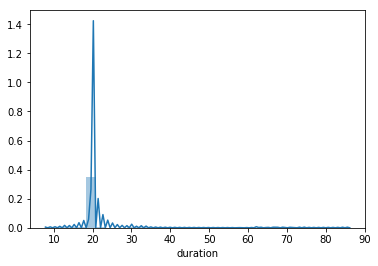

In [26]:
# Time Distribution
print("Average recording time:", np.mean(sounds['duration']), "seconds")
print("Smallest recording time:", np.min(sounds['duration']), "seconds")
print("Longest recording time:", np.max(sounds['duration']), "seconds")

sns.distplot(sounds['duration'])

In [98]:
#Healthy
ipd.Audio(audio_files[2])

In [99]:
#COPD
ipd.Audio(audio_files[8])

In [100]:
#URTI
ipd.Audio(audio_files[1])

In [103]:
#Pneumonia
ipd.Audio(audio_files[919])

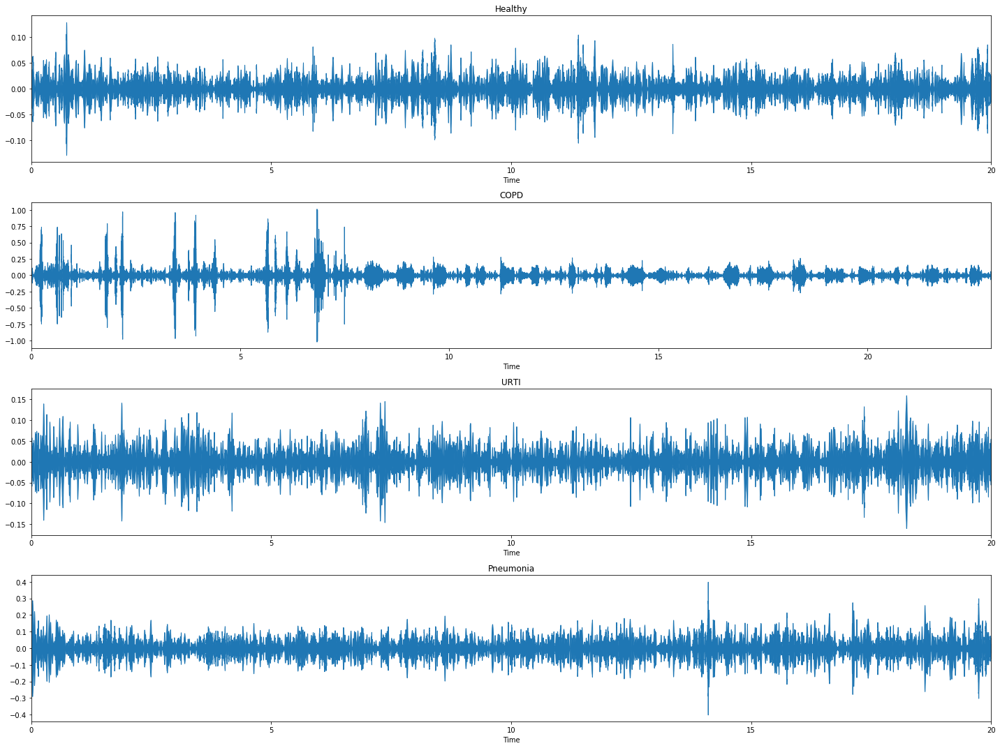

In [113]:
#waveplots -- librosa plot
plt.figure(figsize=(20, 15))

plt.subplot(4, 1, 1)
y, sr = librosa.load(audio_files[2])
librosa.display.waveplot(y, sr=sr)
plt.title("Healthy")

plt.subplot(4, 1, 2)
y, sr = librosa.load(audio_files[8])
librosa.display.waveplot(y, sr=sr)
plt.title("COPD")

plt.subplot(4, 1, 3)
y, sr = librosa.load(audio_files[1])
librosa.display.waveplot(y, sr=sr)
plt.title("URTI")

plt.subplot(4, 1, 4)
y, sr = librosa.load(audio_files[919])
librosa.display.waveplot(y, sr=sr)
plt.title("Pneumonia")

plt.tight_layout()
plt.show()

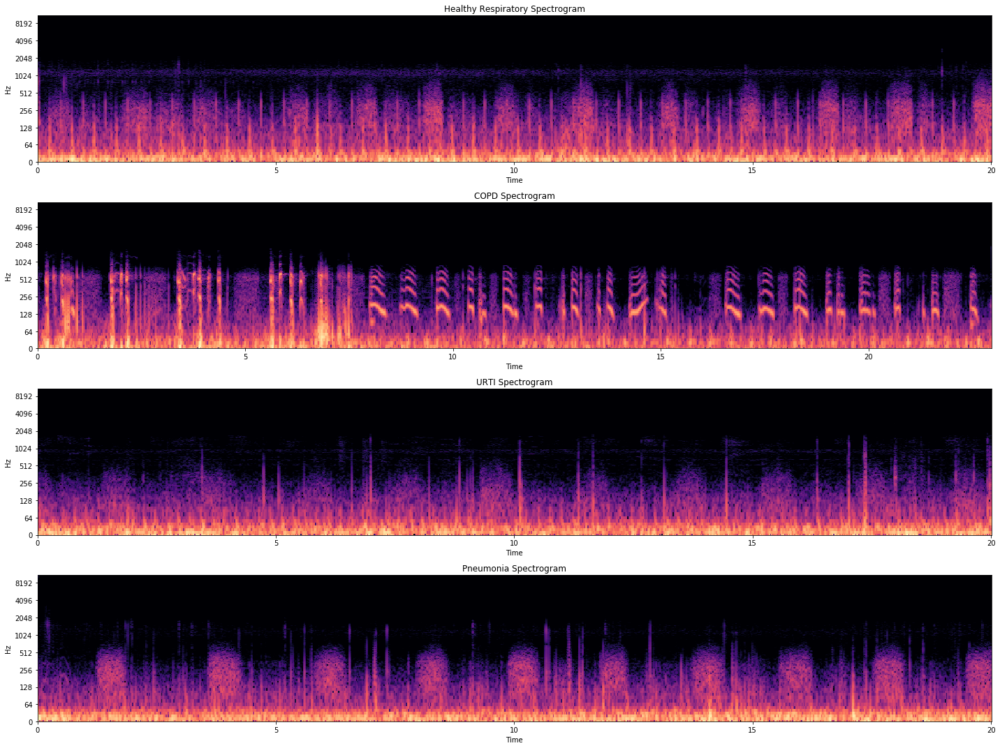

In [114]:
# Spectrograms
plt.figure(figsize=(20, 15))

plt.subplot(4, 1, 1)
y, sr = librosa.load(audio_files[2])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Healthy Respiratory Spectrogram")

plt.subplot(4, 1, 2)
y, sr = librosa.load(audio_files[8])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("COPD Spectrogram")

plt.subplot(4, 1, 3)
y, sr = librosa.load(audio_files[1])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("URTI Spectrogram")

plt.subplot(4, 1, 4)
y, sr = librosa.load(audio_files[919])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Pneumonia Spectrogram")

plt.tight_layout()
plt.show()

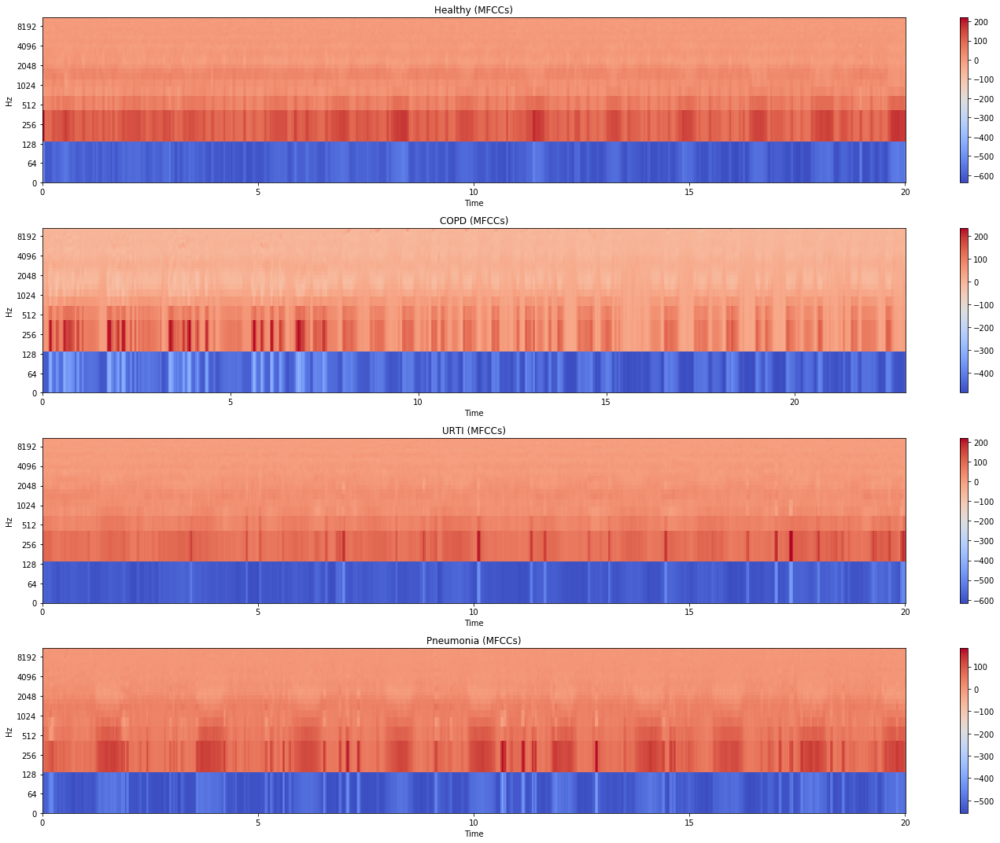

In [115]:
# MFCCs
plt.figure(figsize=(20, 15))

plt.subplot(4, 1, 1)
y, sr = librosa.load(audio_files[2])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Healthy (MFCCs)')

plt.subplot(4, 1, 2)
y, sr = librosa.load(audio_files[8])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('COPD (MFCCs)')

plt.subplot(4, 1, 3)
y, sr = librosa.load(audio_files[1])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('URTI (MFCCs)')

plt.subplot(4, 1, 4)
y, sr = librosa.load(audio_files[919])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Pneumonia (MFCCs)')

plt.tight_layout()
plt.show()

## Modelling

In [42]:
#spread out spec data for input into models
mean_spec = final['spec'].apply(pd.Series)
mean_spec = mean_spec.rename(columns = lambda x : 'spec_' + str(x))
mean_spec.head()

,spec_0,spec_1,spec_2,spec_3,spec_4,spec_5,spec_6,spec_7,spec_8,spec_9,...,spec_1015,spec_1016,spec_1017,spec_1018,spec_1019,spec_1020,spec_1021,spec_1022,spec_1023,spec_1024
0,8.123447,12.025115,11.816886,8.981364,5.779897,4.188724,2.528362,-0.755070,-2.653456,-3.316959,...,-42.535259,-42.535275,-42.535282,-42.535301,-42.535301,-42.535301,-42.535301,-42.535313,-42.535320,-42.535328
1,5.762590,9.940660,8.972795,5.579129,3.610048,1.060689,-1.936463,-5.274032,-8.373034,-10.520452,...,-41.750599,-41.750626,-41.750622,-41.750664,-41.750664,-41.750664,-41.750656,-41.750668,-41.750694,-41.750664
2,3.959942,6.675737,4.303745,0.144419,-2.258024,-4.340283,-7.488881,-10.965380,-12.695719,-13.499794,...,-46.575901,-46.575901,-46.575893,-46.575893,-46.575909,-46.575916,-46.575909,-46.575897,-46.575886,-46.575882
3,23.069111,29.050039,26.390932,17.755230,12.274289,6.872453,3.626569,1.385379,-0.608749,-2.251781,...,-25.977005,-25.977005,-25.977015,-25.977015,-25.977022,-25.977024,-25.977024,-25.977022,-25.977024,-25.977034
4,1.839096,3.431329,4.312777,4.521589,3.589658,1.643603,-0.726662,-2.173375,-3.377479,-5.078349,...,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284,-30.126284


In [46]:
from sklearn.preprocessing import StandardScaler
X = mean_spec
target = final['Diagnosis']
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, target, train_size = 0.75)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [48]:
# Logistic Regression Model - spectrogram
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(penalty='l2', dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='newton-cg', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(lr, X, target, cv = 5))

0.9043478260869565
[[  0   0   0   0   0   0   0]
 [  0   2   0   0   0   0   0]
 [  0   0   0   2   3   0   0]
 [  0   0   0 197   1   1   0]
 [  0   0   2   3   5   1   0]
 [  0   0   0   4   0   4   0]
 [  1   0   0   4   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.81382979 0.86021505 0.9076087  0.90607735 0.80110497]


In [49]:
# KNN model - spectrogram
from sklearn.neighbors import KNeighborsClassifier

neighbors = KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)
neighbors.fit(X_train, y_train)
y_pred = neighbors.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(neighbors, X, target, cv = 5))

0.8652173913043478
[[  0   0   0   0   0   0   0]
 [  0   0   0   2   0   0   0]
 [  1   1   0   2   0   0   1]
 [  0   0   0 199   0   0   0]
 [  0   1   1   7   0   1   1]
 [  0   0   0   8   0   0   0]
 [  0   0   0   5   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.81382979 0.75268817 0.875      0.82872928 0.80110497]


In [50]:
# Random Forest Model - spectrogram
from sklearn import ensemble

rfc = ensemble.RandomForestClassifier(n_estimators=150, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight='balanced')
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(rfc, X, target, cv = 5))

0.8434782608695652
[[  1   0   1   0   0   0]
 [  1   0   4   0   0   0]
 [  2   0 191   3   0   3]
 [  0   1   6   0   2   2]
 [  0   0   6   0   2   0]
 [  0   0   5   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.84042553 0.80645161 0.88586957 0.86187845 0.85635359]


In [51]:
# Gradient Boosting Model -- spectrogram
gb = ensemble.GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, min_impurity_split=None, init=None, random_state=None, max_features='auto', verbose=0, max_leaf_nodes=None, warm_start=False, presort='auto', validation_fraction=0.1, n_iter_no_change=None, tol=0.0001)
gb.fit(X_train, y_train)

print(accuracy_score(y_test, gb.predict(X_test)))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(gb, X, target, cv = 5))

0.9
[[  1   0   1   0   0   0]
 [  1   0   4   0   0   0]
 [  2   0 191   3   0   3]
 [  0   1   6   0   2   2]
 [  0   0   6   0   2   0]
 [  0   0   5   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.84042553 0.84408602 0.90217391 0.85635359 0.83977901]


In [52]:
#spread out mfcc data for input into models
mean_mfcc = final['mfccs_flat'].apply(pd.Series)
mean_mfcc = mean_mfcc.rename(columns = lambda x : 'mean_mfcc_' + str(x))
mean_mfcc.head()

,mean_mfcc_0,mean_mfcc_1,mean_mfcc_2,mean_mfcc_3,mean_mfcc_4,mean_mfcc_5,mean_mfcc_6,mean_mfcc_7,mean_mfcc_8,mean_mfcc_9,...,mean_mfcc_30,mean_mfcc_31,mean_mfcc_32,mean_mfcc_33,mean_mfcc_34,mean_mfcc_35,mean_mfcc_36,mean_mfcc_37,mean_mfcc_38,mean_mfcc_39
0,-515.678284,113.958366,71.159416,42.378330,33.491215,28.343691,20.493902,16.771233,18.421787,16.688015,...,1.085946,1.420841,1.723369,1.759100,1.764396,1.900784,2.010527,1.875236,1.505518,1.274461
1,-572.695801,103.284943,56.087303,30.842743,33.551819,37.284496,28.702307,19.017298,16.912680,15.512327,...,1.518936,2.742966,3.569757,3.054491,2.110286,2.256540,3.312136,3.682358,2.659006,1.143951
2,-580.974670,121.591965,56.966473,25.959740,34.997261,43.360134,28.370544,6.880596,-0.109614,5.383647,...,3.356558,2.354979,1.213654,2.023259,3.549309,3.411893,2.199108,2.197356,3.192662,3.001633
3,-408.962036,71.442039,48.838448,34.060986,30.043154,26.994886,21.588650,17.744015,16.413185,14.409512,...,4.353942,3.911645,3.508018,2.967844,2.514060,2.373760,2.389124,2.494671,2.924427,3.568199
4,-436.719177,116.142838,77.762695,38.060440,12.855058,4.526144,6.410844,11.374701,15.793918,18.486288,...,2.650678,3.115096,3.483489,3.912178,4.325048,4.441020,4.091199,3.439331,2.799393,2.289464


In [53]:
X = mean_mfcc
target = final['Diagnosis']
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, target, train_size = 0.75)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [54]:
# Logistic Regression Model - mfcc
lr = LogisticRegression(penalty='l2', dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='newton-cg', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(lr, X, target, cv = 5))

0.8652173913043478
[[  4   0   2   0   0   0]
 [  0   0   1   0   0   1]
 [  0   0 188   1   7   1]
 [  0   0   4   5   1   0]
 [  0   0   7   0   2   0]
 [  0   1   4   1   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.84042553 0.84408602 0.91304348 0.87292818 0.8121547 ]


In [55]:
# KNN Model - mfccs
neighbors = KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)
neighbors.fit(X_train, y_train)
y_pred = neighbors.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(neighbors, X, target, cv = 5))

0.9173913043478261
[[  3   0   3   0   0   0]
 [  0   0   1   0   1   0]
 [  0   0 195   2   0   0]
 [  0   0   2   7   1   0]
 [  0   0   4   0   5   0]
 [  0   0   4   1   0   1]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.86170213 0.85483871 0.9076087  0.89502762 0.83425414]


In [56]:
# Random Forest Model - mfccs
rfc = ensemble.RandomForestClassifier(n_estimators=150, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight='balanced')
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(rfc, X, target, cv = 5))

0.8782608695652174
[[  0   0   6   0   0   0]
 [  0   0   2   0   0   0]
 [  0   0 197   0   0   0]
 [  0   0   8   2   0   0]
 [  0   0   6   0   3   0]
 [  0   0   6   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.86170213 0.83333333 0.86956522 0.89502762 0.87292818]


In [57]:
# Gradient Boosting Model -- spectrogram
gb = ensemble.GradientBoostingClassifier(loss='deviance', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, min_impurity_split=None, init=None, random_state=None, max_features='auto', verbose=0, max_leaf_nodes=None, warm_start=False, presort='auto', validation_fraction=0.1, n_iter_no_change=None, tol=0.0001)
gb.fit(X_train, y_train)

print(accuracy_score(y_test, gb.predict(X_test)))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(gb, X, target, cv = 5))

0.8869565217391304
[[  0   0   6   0   0   0]
 [  0   0   2   0   0   0]
 [  0   0 197   0   0   0]
 [  0   0   8   2   0   0]
 [  0   0   6   0   3   0]
 [  0   0   6   0   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


[0.85106383 0.82795699 0.89673913 0.87845304 0.84530387]


### Deep Learning with Spectrograms

In [129]:
x_data = np.concatenate((sounds_spec, ))
x_data = StandardScaler().fit_transform(x_data)
x_data.shape

(920, 1025)

In [130]:
# Map label text to integer
CLASSES = ['Healthy', 'COPD', 'Pneumonia', 'URTI', 'Bronchiectasis', 'Bronchiolitis', 'LRTI', 'Asthma']

# Map integer value to text labels
label_to_int = {k:v for v,k in enumerate(CLASSES)}
print (label_to_int)
print (" ")
# map integer to label text
int_to_label = {v:k for k,v in label_to_int.items()}
print(int_to_label)

{'Healthy': 0, 'COPD': 1, 'Pneumonia': 2, 'URTI': 3, 'Bronchiectasis': 4, 'Bronchiolitis': 5, 'LRTI': 6, 'Asthma': 7}
 
{0: 'Healthy', 1: 'COPD', 2: 'Pneumonia', 3: 'URTI', 4: 'Bronchiectasis', 5: 'Bronchiolitis', 6: 'LRTI', 7: 'Asthma'}


In [132]:
y_data = final['Diagnosis']
y_data.shape

(920,)

In [146]:
len(CLASSES)

8

In [147]:
seed=1234
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, train_size=0.9, random_state=seed, shuffle=True)
y_train = np.array(keras.utils.to_categorical(y_train, 8))
y_test = np.array(keras.utils.to_categorical(y_test, 8))

ValueError: invalid literal for int() with base 10: 'COPD'

In [144]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(828, 1025)
(92, 1025)
(828,)
(92,)


In [ ]:
# saved model checkpoint file
best_model_file="./best_model_trained.hdf5"
#train_model_file=file_path+"/checkpoints/weights.best_{epoch:02d}-{loss:.2f}.hdf5"

MAX_PATIENT=12
# max_patient - number of epochs that produced the monitored quantity with no improvement after which training will be stopped 
MAX_EPOCHS=100

MAX_BATCH=32
# number of training examples in one forward/backward pass

In [ ]:
# Start with a simple sequential model
model = Sequential()

# Add dense layers to create a fully connected MLP
model.add(Dense(64, activation='relu', input_shape=(1025,))) # will output the input directly if positive, otherwise 0
# Dropout layers remove features and fight overfitting
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.1))
# End with a number of units equal to the number of classes we have for our outcome
model.add(Dense(3, activation='softmax')) #softmax - normalizes layer into a probability distribution adding up to 1

model.summary()

# Compile the model to put it all together.
model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(), # optimizers update the weight parameters to minimize the loss function
              metrics=['accuracy'])

history = model.fit(x_train, y_train,
                    batch_size=128,
                    epochs=MAX_EPOCHS,
                    verbose=0,
                    validation_data=(x_test, y_test),
                    class_weight={0:1, 1:1.5, 2:1})

score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

In [ ]:
predictions = model.predict(x_test)
y_pred = (predictions > 0.5)

print(metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

In [ ]:
x_train = x_train.reshape(3744, 1025, 1)
x_test = x_test.reshape(416, 1025, 1)

print('LSTM model: Spectrogram Data')
model = Sequential()
model.add(LSTM(units=32, dropout=0.05, recurrent_dropout=0.20, return_sequences=True, input_shape = (1025,1)))
model.add(LSTM(units=32, dropout=0.05, recurrent_dropout=0.20, return_sequences=False))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='Adamax', metrics=['acc','mse', 'mae', 'mape', 'cosine'])
model.summary()

# callbacks
# removed EarlyStopping(patience=MAX_PATIENT)
callback=[ReduceLROnPlateau(patience=MAX_PATIENT, verbose=1),
          ModelCheckpoint(filepath=best_model_file, monitor='loss', verbose=1, save_best_only=True)]

print ("training started..... please wait.")
# training
history=model.fit(x_train, y_train, 
                  batch_size=MAX_BATCH, 
                  epochs=25,
                  verbose=0,
                  callbacks=callback,
                  validation_data=(x_test, y_test),
                  class_weight={0:1, 1:1.5, 2:1}) 

print ("training finised!")

# Keras reported accuracy:
score = model.evaluate(x_train, y_train, verbose=0) 
print ("model train data score       : ",round(score[1]*100) , "%")

score = model.evaluate(x_test, y_test, verbose=0) 
print ("model test data score        : ",round(score[1]*100) , "%")

In [ ]:
predictions = model.predict(x_test)
y_pred = (predictions > 0.5)

print(metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

### Deep Learning with MFCC

In [128]:
x_data = np.concatenate((sounds_mfcc, ))
x_data.shape

(920, 40, 1)